# imports

In [2]:
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import tifffile as tiff
from tqdm import tqdm
from IPython.display import Image, display
import torch.nn.functional as F
from scipy.ndimage import distance_transform_edt, binary_dilation, binary_erosion, generate_binary_structure

import os, json, glob, random, copy
import numpy as np
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split, ConcatDataset, Subset

print("CUDA available:", torch.cuda.is_available())
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

CUDA available: True


# Data split and visualization

Chosen: /media/user/data_nvme/groundice/data/train/train/128train/128/train128/gl_069_180329-180404-180410-180416_010245-021316-010420-021491_T110605_T110606_x2374_y1424_s128.npz


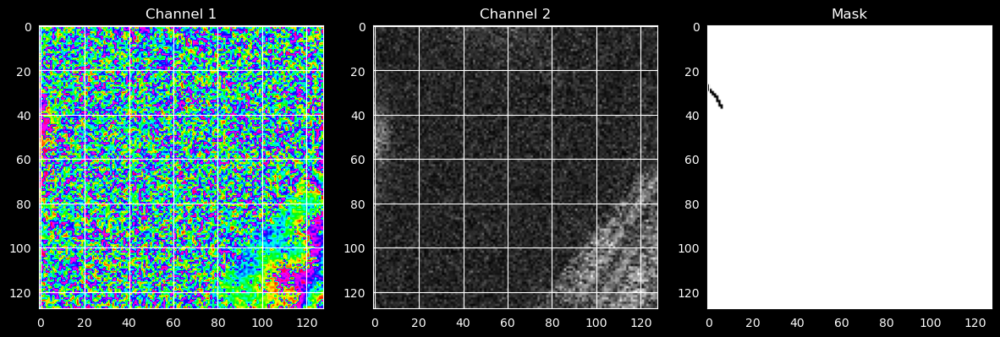

In [3]:
folder128 = r"/media/user/data_nvme/groundice/data/train/train/128train/128/train128/"

# picking a random .npz file from the folder
files = [f for f in os.listdir(folder128) if f.endswith(".npz")]
chosen = random.choice(files)
path = os.path.join(folder128, chosen)
print("Chosen:", path)

data = np.load(path)
image, mask = data["image"], data["mask"]

# plot
fig, axs = plt.subplots(1, 3, figsize=(12, 4))
axs[0].imshow(image[0], cmap="hsv")
axs[0].set_title("Channel 1")
axs[1].imshow(image[1], cmap="gray")
axs[1].set_title("Channel 2")
axs[2].imshow(mask[0], cmap="binary")
axs[2].set_title("Mask")

plt.tight_layout()
#plt.savefig("test.png", bbox_inches="tight")
plt.show()

Chosen: /media/user/data_nvme/groundice/data/train/train/256train/256/train256/gl_069_181206-181212-181218-181224_013920-024991-014095-025166_T110456_T110455_x1451_y1734_s256.npz


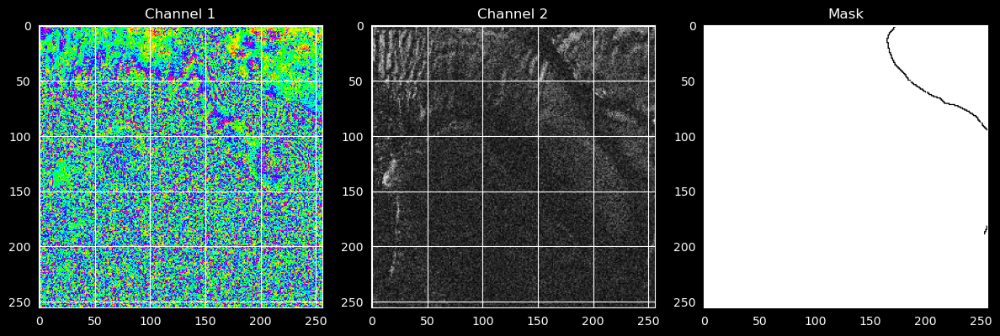

In [4]:
folder256 = r"/media/user/data_nvme/groundice/data/train/train/256train/256/train256/"

# picking a random .npz file from the folder
files = [f for f in os.listdir(folder256) if f.endswith(".npz")]
chosen = random.choice(files)
path = os.path.join(folder256, chosen)
print("Chosen:", path)

data = np.load(path)
image, mask = data["image"], data["mask"]

# plot
fig, axs = plt.subplots(1, 3, figsize=(12, 4))
axs[0].imshow(image[0], cmap="hsv")
axs[0].set_title("Channel 1")
axs[1].imshow(image[1], cmap="gray")
axs[1].set_title("Channel 2")
axs[2].imshow(mask[0], cmap="binary")
axs[2].set_title("Mask")

plt.tight_layout()
#plt.savefig("test.png", bbox_inches="tight")
plt.show()

In [5]:
class GroundingLineDataset(Dataset):
    def __init__(self, root_dir, scale_phase=True):
        self.files = sorted(glob.glob(os.path.join(root_dir, "*.npz")))
        self.scale_phase = scale_phase
    def __len__(self): return len(self.files)
    def __getitem__(self, idx):
        data = np.load(self.files[idx])
        image = data["image"].astype(np.float32)
        mask  = data["mask"].astype(np.float32)
        if self.scale_phase:
            image[0] = image[0] / np.pi
        image = torch.tensor(image, dtype=torch.float32)
        mask  = torch.tensor(mask,  dtype=torch.float32)
        if mask.ndim == 2:
            mask = mask.unsqueeze(0)
        return image, mask

def make_loaders(root_dir, noise_dir, batch_size=50, noise_cap=1000, seed=1234, split=(0.7,0.15,0.15)):
    dataset = GroundingLineDataset(root_dir,  scale_phase=True)
    noise   = GroundingLineDataset(noise_dir, scale_phase=True)
    noise_subset = Subset(noise, list(range(min(noise_cap, len(noise)))))
    combined = ConcatDataset([dataset, noise_subset])
    n_total = len(combined)
    n_train = int(split[0] * n_total)
    n_val   = int(split[1] * n_total)
    n_test  = n_total - n_train - n_val
    g = torch.Generator().manual_seed(seed)
    train_set, val_set, test_set = random_split(combined, [n_train, n_val, n_test], generator=g)
    splits = {"train": train_set.indices, "val": val_set.indices, "test": test_set.indices}
    return train_set, val_set, test_set, splits

def build_loaders(train_set, val_set, test_set, batch_size=50):
    return (
        DataLoader(train_set, batch_size=batch_size, shuffle=True,  num_workers=0, pin_memory=True),
        DataLoader(val_set,   batch_size=batch_size, shuffle=False, num_workers=0, pin_memory=True),
        DataLoader(test_set,  batch_size=batch_size, shuffle=False, num_workers=0, pin_memory=True),
    )

folder128 = r"/media/user/data_nvme/groundice/data/train/train/128train/128/train128/"
noise128  = r"/media/user/data_nvme/groundice/data/train/train/128train/128/noise_128/"
folder256 = r"/media/user/data_nvme/groundice/data/train/train/256train/256/train256/"
noise256  = r"/media/user/data_nvme/groundice/data/train/train/256train/256/noise_256/"

batch_size = 25

train128, val128, test128, splits128 = make_loaders(folder128, noise128, batch_size=batch_size, noise_cap=1000)
train256, val256, test256, splits256 = make_loaders(folder256, noise256, batch_size=batch_size, noise_cap=1000)

with open("splits_pc128.json","w") as f: json.dump(splits128, f)
with open("splits_pc256.json","w") as f: json.dump(splits256, f)

train_loader128, val_loader128, test_loader128 = build_loaders(train128, val128, test128, batch_size=batch_size)
train_loader256, val_loader256, test_loader256 = build_loaders(train256, val256, test256, batch_size=batch_size)

print(f"[128] Train {len(train128)} | Val {len(val128)} | Test {len(test128)}, | Total {len(train128)+len(val128)+len(test128)}")
print(f"[256] Train {len(train256)} | Val {len(val256)} | Test {len(test256)}, | Total {len(train256)+len(val256)+len(test256)}")

[128] Train 15679 | Val 3360 | Test 3361, | Total 22400
[256] Train 10504 | Val 2251 | Test 2252, | Total 15007


# U-Net architecture

In [7]:
def match_spatial_size(tensor, target_h, target_w):
    h, w = tensor.shape[2], tensor.shape[3]

    if h >= target_h and w >= target_w:
        start_h = (h - target_h) // 2
        start_w = (w - target_w) // 2
        return tensor[:, :, start_h:start_h + target_h, start_w:start_w + target_w]

    pad_h = max(0, target_h - h)
    pad_w = max(0, target_w - w)
    pad_left = pad_w // 2
    pad_right = pad_w - pad_left
    pad_top = pad_h // 2
    pad_bottom = pad_h - pad_top

    return F.pad(tensor, (pad_left, pad_right, pad_top, pad_bottom))

def get_main_logit(logits):
    """Return the highest-resolution logit (last) when using deep supervision."""
    if isinstance(logits, (list, tuple)):
        return logits[-1]
    return logits

## U-Net Blocks

In [8]:
class Encoding_Unit(nn.Module):

    def __init__(self, in_channels, out_channels):
        super().__init__()

        self.enc_block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.enc_block(x)

class Decoding_Unit(nn.Module):

    def __init__(self, in_channels, out_channels):

        super().__init__()

        self.upsample = nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2) # This doubles HxW
        # Concatenate the symmetric Layer from the encoder
        self.concat_and_conv = nn.Sequential(
            nn.Conv2d(out_channels * 3, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x, skip_connections_features):
        x = self.upsample(x)
        skip_features = match_spatial_size(skip_connections_features, x.shape[2], x.shape[3])
        x = torch.cat([x, skip_features], dim=1)  # 2*out_ch channels
        return self.concat_and_conv(x)


# Bottleneck
class ASPP(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=1, padding=0, dilation=1)
        self.conv2 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=6, dilation=6)
        self.conv3 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=12, dilation=12)
        self.conv4 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=18, dilation=18)
        self.pool = nn.AdaptiveAvgPool2d(1)
        self.conv_pool = nn.Conv2d(in_channels, out_channels, kernel_size=1)
        self.project = nn.Conv2d(out_channels*5, out_channels, kernel_size=1)

    def forward(self, x):
        h, w = x.shape[2], x.shape[3]
        feat1 = self.conv1(x)
        feat2 = self.conv2(x)
        feat3 = self.conv3(x)
        feat4 = self.conv4(x)
        pool = self.pool(x)
        pool = self.conv_pool(pool)
        pool = F.interpolate(pool, size=(h, w), mode="bilinear", align_corners=False)
        feats = torch.cat([feat1, feat2, feat3, feat4, pool], dim=1)
        return self.project(feats)

## U-Net

In [9]:
class U_net(nn.Module):

    def __init__(self, out_ch = 1, in_ch = 2):
        super().__init__()

        # Encoder
        self.enc_lvl1 = Encoding_Unit(in_ch, in_ch*2)
        self.enc_lvl2 = Encoding_Unit(in_ch*2, in_ch*4)
        self.enc_lvl3 = Encoding_Unit(in_ch*4, in_ch*8)
        self.enc_lvl4 = Encoding_Unit(in_ch*8, in_ch*16)
        self.enc_pool = nn.MaxPool2d(2, 2, return_indices=True)

        # Bottleneck
        self.bottleneck = ASPP(in_ch*16, in_ch*16)

        # Decoder
        self.dec_lvl4 = Decoding_Unit(in_ch*16, in_ch*8)
        self.dec_lvl3 = Decoding_Unit(in_ch*8, in_ch*4)
        self.dec_lvl2 = Decoding_Unit(in_ch*4, in_ch*2)
        self.dec_lvl1 = Decoding_Unit(in_ch*2, in_ch)

        self.final = nn.Conv2d(in_ch, out_ch, kernel_size=1)

    def forward(self, x):
        # Encoder + save skips and indices
        s1 = self.enc_lvl1(x)            # [B, out_ch, H, W]
        p1, idx1 = self.enc_pool(s1)     # [B, out_ch, H/2, W/2]

        s2 = self.enc_lvl2(p1)           # [B, out_ch*2, H/2, W/2]
        p2, idx2 = self.enc_pool(s2)     # [B, out_ch*2, H/4, W/4]

        s3 = self.enc_lvl3(p2)           # [B, out_ch*4, H/4, W/4]
        p3, idx3 = self.enc_pool(s3)     # [B, out_ch*4, H/8, W/8]

        s4 = self.enc_lvl4(p3)           # [B, out_ch*8, H/8, W/8]
        p4, idx4 = self.enc_pool(s4)     # [B, out_ch*8, H/16, W/16]

        # Bottleneck
        b = self.bottleneck(p4)      # [B, out_ch*8, H/16, W/16]

        # Decoder (transpose conv upsample + concat with skips)
        d4 = self.dec_lvl4(b, s4)        # -> [B, out_ch*4, H/8, W/8]
        d3 = self.dec_lvl3(d4, s3)       # -> [B, out_ch*2, H/4, W/4]
        d2 = self.dec_lvl2(d3, s2)       # -> [B, out_ch, H/2, W/2]
        d1 = self.dec_lvl1(d2, s1)       # -> [B, out_ch, H, W]

        out = self.final(d1)         # [B, n_classes, H, W] logits
        return out

# Att U-Net architecture

## Att U-Net blocks

In [10]:
class Encoding_Unit_ATT(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.enc_block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.enc_block(x)

class AttentionBlock(nn.Module):
    def __init__(self, F_g, F_l, F_int):
        super().__init__()
        self.W_g = nn.Sequential(
            nn.Conv2d(F_g, F_int, kernel_size=1, padding=0, bias=True),
            nn.BatchNorm2d(F_int)
        )
        self.W_x = nn.Sequential(
            nn.Conv2d(F_l, F_int, kernel_size=1, padding=0, bias=True),
            nn.BatchNorm2d(F_int)
        )
        self.psi = nn.Sequential(
            nn.Conv2d(F_int, 1, kernel_size=1, padding=0, bias=True),
            nn.BatchNorm2d(1),
            nn.Sigmoid()
        )
        self.relu = nn.ReLU(inplace=True)

    def forward(self, g, x):
        g1 = self.W_g(g)
        x1 = self.W_x(x)
        psi = self.relu(g1 + x1)
        psi = self.psi(psi)
        return x * psi  # gating

class ASPP(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=1, padding=0, dilation=1)
        self.conv2 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=6, dilation=6)
        self.conv3 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=12, dilation=12)
        self.conv4 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=18, dilation=18)
        self.pool = nn.AdaptiveAvgPool2d(1)
        self.conv_pool = nn.Conv2d(in_channels, out_channels, kernel_size=1)
        self.project = nn.Conv2d(out_channels * 5, out_channels, kernel_size=1)

    def forward(self, x):
        h, w = x.shape[2], x.shape[3]
        feat1 = self.conv1(x)
        feat2 = self.conv2(x)
        feat3 = self.conv3(x)
        feat4 = self.conv4(x)
        pool = self.pool(x)
        pool = self.conv_pool(pool)
        pool = F.interpolate(pool, size=(h, w), mode="bilinear", align_corners=False)
        feats = torch.cat([feat1, feat2, feat3, feat4, pool], dim=1)
        return self.project(feats)

class Decoding_Unit_ATT(nn.Module):
    def __init__(self, in_channels, out_channels, skip_channels):
        super().__init__()
        self.upsample = nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)
        self.attention = AttentionBlock(
            F_g=out_channels,
            F_l=skip_channels,
            F_int=max(1, min(out_channels, skip_channels) // 2)
        )
        self.concat_and_conv = nn.Sequential(
            nn.Conv2d(out_channels + skip_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x, skip_connection):
        x = self.upsample(x)
        skip = match_spatial_size(skip_connection, x.shape[2], x.shape[3])
        attended_skip = self.attention(g=x, x=skip)
        x = torch.cat([x, attended_skip], dim=1)
        return self.concat_and_conv(x)

## Att U-Net

In [11]:
class Attention_U_net(nn.Module):
    def __init__(self, out_ch=1, in_ch=2):
        super().__init__()
        features = [in_ch * 2, in_ch * 4, in_ch * 8, in_ch * 16]

        # Encoder
        self.enc_lvl1 = Encoding_Unit_ATT(in_ch, features[0])
        self.enc_lvl2 = Encoding_Unit_ATT(features[0], features[1])
        self.enc_lvl3 = Encoding_Unit_ATT(features[1], features[2])
        self.enc_lvl4 = Encoding_Unit_ATT(features[2], features[3])
        self.enc_pool = nn.MaxPool2d(2, 2)

        # Bottleneck
        self.bottleneck = ASPP(features[3], features[3])

        # Decoder con attention
        self.dec_lvl4 = Decoding_Unit_ATT(features[3], features[2], skip_channels=features[3])
        self.dec_lvl3 = Decoding_Unit_ATT(features[2], features[1], skip_channels=features[2])
        self.dec_lvl2 = Decoding_Unit_ATT(features[1], features[0], skip_channels=features[1])
        self.dec_lvl1 = Decoding_Unit_ATT(features[0], in_ch, skip_channels=features[0])

        # for deep supervision
        # self.aux4 = nn.Conv2d(features[2], out_ch, kernel_size=1)  # H/8
        # self.aux3 = nn.Conv2d(features[1], out_ch, kernel_size=1)  # H/4
        # self.aux2 = nn.Conv2d(features[0], out_ch, kernel_size=1)  # H/2

        # Output finale
        self.final = nn.Conv2d(in_ch, out_ch, kernel_size=1)  # H

    def forward(self, x):
        # Encoder
        s1 = self.enc_lvl1(x); p1 = self.enc_pool(s1)
        s2 = self.enc_lvl2(p1); p2 = self.enc_pool(s2)
        s3 = self.enc_lvl3(p2); p3 = self.enc_pool(s3)
        s4 = self.enc_lvl4(p3); p4 = self.enc_pool(s4)

        # Bottleneck
        b = self.bottleneck(p4)

        # Decoder
        d4 = self.dec_lvl4(b, s4)   # H/8
        d3 = self.dec_lvl3(d4, s3)  # H/4
        d2 = self.dec_lvl2(d3, s2)  # H/2
        d1 = self.dec_lvl1(d2, s1)  # H

        # used for Deep supervision
        # o4 = self.aux4(d4)  # H/8
        # o3 = self.aux3(d3)  # H/4
        # o2 = self.aux2(d2)  # H/2

        of = self.final(d1)        # H

        return of

        # for deepsup
        # return [o4, o3, o2, of]

# U-Net++ architecture (deep supervision)

In [12]:
class ConvBlock(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True)
        )
    def forward(self, x):
        return self.block(x)

class UNetPP(nn.Module):
    """U-Net++ with deep supervision (four outputs)."""
    def __init__(self, in_ch=2, out_ch=1, base_ch=32, deep_supervision=True):
        super().__init__()
        self.deep_supervision = deep_supervision
        f1, f2, f3, f4, f5 = base_ch, base_ch*2, base_ch*4, base_ch*8, base_ch*16

        # Encoder (level 0)
        self.x00 = ConvBlock(in_ch, f1)
        self.x10 = ConvBlock(f1, f2)
        self.x20 = ConvBlock(f2, f3)
        self.x30 = ConvBlock(f3, f4)
        self.x40 = ConvBlock(f4, f5)

        self.pool = nn.MaxPool2d(2)

        # Dense skip decoder parts
        self.x01 = ConvBlock(f1 + f2, f1)
        self.x11 = ConvBlock(f2 + f3, f2)
        self.x21 = ConvBlock(f3 + f4, f3)
        self.x31 = ConvBlock(f4 + f5, f4)

        self.x02 = ConvBlock(f1*2 + f2, f1)
        self.x12 = ConvBlock(f2*2 + f3, f2)
        self.x22 = ConvBlock(f3*2 + f4, f3)

        self.x03 = ConvBlock(f1*3 + f2, f1)
        self.x13 = ConvBlock(f2*3 + f3, f2)

        self.x04 = ConvBlock(f1*4 + f2, f1)

        # Final heads for deep supervision
        if deep_supervision:
            self.final1 = nn.Conv2d(f1, out_ch, kernel_size=1)
            self.final2 = nn.Conv2d(f1, out_ch, kernel_size=1)
            self.final3 = nn.Conv2d(f1, out_ch, kernel_size=1)
            self.final4 = nn.Conv2d(f1, out_ch, kernel_size=1)
        else:
            self.final = nn.Conv2d(f1, out_ch, kernel_size=1)

    def forward(self, x):
        x00 = self.x00(x)
        x10 = self.x10(self.pool(x00))
        x20 = self.x20(self.pool(x10))
        x30 = self.x30(self.pool(x20))
        x40 = self.x40(self.pool(x30))

        x01 = self.x01(torch.cat([x00, F.interpolate(x10, scale_factor=2, mode='bilinear', align_corners=False)], dim=1))
        x11 = self.x11(torch.cat([x10, F.interpolate(x20, scale_factor=2, mode='bilinear', align_corners=False)], dim=1))
        x21 = self.x21(torch.cat([x20, F.interpolate(x30, scale_factor=2, mode='bilinear', align_corners=False)], dim=1))
        x31 = self.x31(torch.cat([x30, F.interpolate(x40, scale_factor=2, mode='bilinear', align_corners=False)], dim=1))

        x02 = self.x02(torch.cat([
            x00,
            x01,
            F.interpolate(x11, scale_factor=2, mode='bilinear', align_corners=False)
        ], dim=1))
        x12 = self.x12(torch.cat([
            x10,
            x11,
            F.interpolate(x21, scale_factor=2, mode='bilinear', align_corners=False)
        ], dim=1))
        x22 = self.x22(torch.cat([
            x20,
            x21,
            F.interpolate(x31, scale_factor=2, mode='bilinear', align_corners=False)
        ], dim=1))

        x03 = self.x03(torch.cat([
            x00,
            x01,
            x02,
            F.interpolate(x12, scale_factor=2, mode='bilinear', align_corners=False)
        ], dim=1))
        x13 = self.x13(torch.cat([
            x10,
            x11,
            x12,
            F.interpolate(x22, scale_factor=2, mode='bilinear', align_corners=False)
        ], dim=1))

        x04 = self.x04(torch.cat([
            x00,
            x01,
            x02,
            x03,
            F.interpolate(x13, scale_factor=2, mode='bilinear', align_corners=False)
        ], dim=1))

        if self.deep_supervision:
            o1 = self.final1(x01)
            o2 = self.final2(x02)
            o3 = self.final3(x03)
            o4 = self.final4(x04)
            return [o1, o2, o3, o4]
        else:
            return self.final(x04)

# Losses & Metrics

In [11]:
class FocalTverskyLoss(nn.Module):
    def __init__(self, alpha=0.7, beta=0.3, gamma=4/3, smooth=1e-6, from_logits=True, clamp=True):
        super().__init__()
        self.alpha = alpha
        self.beta = beta
        self.gamma = gamma
        self.smooth = smooth
        self.from_logits = from_logits
        self.clamp = clamp
    def forward(self, inputs, targets):
        probs = torch.sigmoid(inputs) if self.from_logits else inputs
        if self.clamp:
            probs = probs.clamp(1e-7, 1-1e-7)
        B = probs.size(0)
        probs = probs.view(B, -1)
        targets = targets.view(B, -1).float()
        TP = (probs * targets).sum(dim=1)
        FP = (probs * (1 - targets)).sum(dim=1)
        FN = ((1 - probs) * targets).sum(dim=1)
        tversky = (TP + self.smooth) / (TP + self.alpha * FN + self.beta * FP + self.smooth)
        loss = (1.0 - tversky) ** self.gamma
        return loss.mean()

def combo_loss_single(logits, targets, ftl: FocalTverskyLoss, bce_weight=0.0):
    loss_ftl = ftl(logits, targets)
    if bce_weight <= 0:
        return loss_ftl
    loss_bce = F.binary_cross_entropy_with_logits(logits, targets.float())
    return bce_weight * loss_bce + (1 - bce_weight) * loss_ftl

def combo_loss(logits, targets, ftl: FocalTverskyLoss, bce_weight=0.0, ds_weights=None):
    """Support deep supervision: weighted average loss across logits list."""
    if isinstance(logits, (list, tuple)):
        losses = [combo_loss_single(l, targets, ftl, bce_weight) for l in logits]
        losses = torch.stack(losses)
        if ds_weights is None:
            return losses.mean()
        w = torch.tensor(ds_weights, device=losses.device, dtype=losses.dtype)
        w = w / (w.sum() + 1e-8)
        if w.numel() != losses.numel():
            raise ValueError("ds_weights length must match number of deep-supervision outputs")
        return (losses * w).sum()
    else:
        return combo_loss_single(logits, targets, ftl, bce_weight)

In [13]:
EPS = 1e-6
def _prepare_probs_targets(logits, targets):
    logits = get_main_logit(logits)
    probs = torch.sigmoid(logits)
    if probs.dim() == 4 and probs.size(1) > 1: probs = probs[:,0]
    if targets.dim()==4 and targets.size(1)>1: targets=targets[:,0]
    targets = targets.float()
    B = probs.size(0)
    return probs.view(B,-1), targets.view(B,-1)

def compute_dice_precision_recall(logits, targets, threshold=0.5, use_threshold=True):
    probs, targets = _prepare_probs_targets(logits, targets)
    preds = (probs >= threshold).float() if use_threshold else probs
    TP = (preds * targets).sum(dim=1)
    FP = (preds * (1 - targets)).sum(dim=1)
    FN = ((1 - preds) * targets).sum(dim=1)
    precision = (TP+EPS)/(TP+FP+EPS)
    recall    = (TP+EPS)/(TP+FN+EPS)
    dice      = (2*TP+EPS)/(2*TP+FP+FN+EPS)
    return dice.mean().item(), precision.mean().item(), recall.mean().item()

@torch.no_grad()
def find_best_threshold(model, val_loader, device, ts=np.linspace(0.1,0.9,17)):
    model.eval()
    best_t, best_d = 0.5, -1
    for t in ts:
        d_sum, n = 0.0, 0
        for x,y in val_loader:
            x, y = x.to(device), y.to(device).float()
            logits = model(x)
            d,_,_ = compute_dice_precision_recall(logits, y, threshold=float(t), use_threshold=True)
            d_sum += d; n += 1
        d_avg = d_sum / max(1,n)
        if d_avg > best_d:
            best_d, best_t = d_avg, float(t)
    print(f"Best threshold value: {best_t:.2f} (Dice={best_d:.4f})")
    return best_t

# Training

In [13]:
class EarlyStopping:
    def __init__(self, patience=10, delta=0.0):
        self.patience = patience; self.delta = delta
        self.best = None; self.counter = 0; self.stop = False
        self.best_state = None
    def __call__(self, metric, model):
        if self.best is None or metric < self.best - self.delta:
            self.best = metric
            self.best_state = copy.deepcopy(model.state_dict())
            self.counter = 0
        else:
            self.counter += 1
            if self.counter >= self.patience:
                self.stop = True
    def load_best(self, model):
        if self.best_state is not None:
            model.load_state_dict(self.best_state)

In [14]:
def train_one_epoch(model, loader, optimizer, ftl, bce_weight, device, grad_clip=1.0, ds_weights=None):
    model.train()
    running_loss = running_dice = running_prec = running_rec = 0.0; n=0
    for x,y in loader:
        x, y = x.to(device), y.to(device).float()
        optimizer.zero_grad(set_to_none=True)
        logits = model(x)
        loss = combo_loss(logits, y, ftl, bce_weight=bce_weight, ds_weights=ds_weights)
        loss.backward()
        if grad_clip is not None and grad_clip > 0:
            nn.utils.clip_grad_norm_(model.parameters(), grad_clip)
        optimizer.step()
        d,p,r = compute_dice_precision_recall(logits, y, threshold=0.5)
        running_loss += float(loss); running_dice += d; running_prec += p; running_rec += r; n+=1
    return (running_loss/max(1,n), running_dice/max(1,n), running_prec/max(1,n), running_rec/max(1,n))

@torch.no_grad()
def evaluate(model, loader, ftl, bce_weight, device, ds_weights=None):
    model.eval()
    running_loss = running_dice = running_prec = running_rec = 0.0; n=0
    for x,y in loader:
        x, y = x.to(device), y.to(device).float()
        logits = model(x)
        loss = combo_loss(logits, y, ftl, bce_weight=bce_weight, ds_weights=ds_weights)
        d,p,r = compute_dice_precision_recall(logits, y, threshold=0.5)
        running_loss += float(loss); running_dice += d; running_prec += p; running_rec += r; n+=1
    return (running_loss/max(1,n), running_dice/max(1,n), running_prec/max(1,n), running_rec/max(1,n))

In [15]:
def quick_loss_sweep(model_fn,
                     train_loader,
                     val_loader,
                     device,
                     configs=((0.7,0.3,1.33)),
                     bce_weights=(0.5),
                     ds_weight_sets=(None,),
                     epochs=5,
                     lr=1e-4,
                     weight_decay=1e-5,
                     run_name="sweep"):

    best = None
    results = []
    for cfg in configs:
        a,b,g = cfg
        for bw in bce_weights:
            for ds_w in ds_weight_sets:
                model = model_fn().to(device)
                ftl = FocalTverskyLoss(alpha=a, beta=b, gamma=g)
                opt = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
                best_val = float("inf")
                best_dice = -1.0
                for ep in range(1, epochs+1):
                    tr_loss, tr_d, tr_p, tr_r = train_one_epoch(model, train_loader, opt, ftl, bw, device, grad_clip=1.0, ds_weights=ds_w)
                    va_loss, va_d, va_p, va_r = evaluate(model, val_loader, ftl, bw, device, ds_weights=ds_w)
                    best_val = min(best_val, va_loss)
                    best_dice = max(best_dice, va_d)
                    tqdm.write(f"[{run_name}] cfg={cfg} bce_w={bw} ds_w={ds_w} ep={ep}/{epochs} | tr_loss={tr_loss:.4f} va_loss={va_loss:.4f} va_dice={va_d:.4f}")
                result = {"cfg": cfg, "bce_weight": bw, "ds_weights": ds_w, "best_val_loss": best_val, "best_val_dice": best_dice}
                results.append(result)
                if (best is None) or (best_val < best["best_val_loss"]):
                    best = result
    tqdm.write(f"[{run_name}] best cfg={best['cfg']} | bce_w={best['bce_weight']} | ds_w={best['ds_weights']} | val_loss={best['best_val_loss']:.4f} | val_dice={best['best_val_dice']:.4f}")
    return best, results

In [16]:
def fit_model(model, train_loader, val_loader, device, num_epochs=100,
              lr=1e-4, weight_decay=1e-5, bce_weight=0.3,
              ftl_params=(0.7,0.3,1.33),
              patience=12, save_path="best_model.pth",
              run_name="run",
              ds_weights=None):
    ftl = FocalTverskyLoss(alpha=ftl_params[0], beta=ftl_params[1], gamma=ftl_params[2])
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5, verbose=False)
    early = EarlyStopping(patience=patience, delta=0.0)
    history = {"train_loss": [], "val_loss": [], "train_dice": [], "val_dice": []}
    for epoch in range(1, num_epochs+1):
        tr_loss, tr_d, tr_p, tr_r = train_one_epoch(model, train_loader, optimizer, ftl, bce_weight, device, ds_weights=ds_weights)
        va_loss, va_d, va_p, va_r = evaluate(model, val_loader, ftl, bce_weight, device, ds_weights=ds_weights)
        history["train_loss"].append(tr_loss); history["val_loss"].append(va_loss)
        history["train_dice"].append(tr_d);   history["val_dice"].append(va_d)
        scheduler.step(va_loss)
        lr_now = min(g["lr"] for g in optimizer.param_groups)
        tqdm.write(f"[{run_name}] Ep {epoch:03d} | TR loss {tr_loss:.4f} dice {tr_d:.4f} | VA loss {va_loss:.4f} dice {va_d:.4f} | lr {lr_now:.2e}")
        if va_loss <= min(history["val_loss"]):
            torch.save(model.state_dict(), save_path)
            tqdm.write(f"  -> Saved best to {save_path}")
        early(va_loss, model)
        if early.stop:
            tqdm.write("Early stopping triggered."); break
    early.load_best(model)
    return model, history

In [17]:
os.makedirs("checkpoints", exist_ok=True)

# parameters to explore with gridsearch
sweep_cfgs = ((0.7,0.3,1.33),(0.8,0.2,1.33),(0.75,0.25,1.33),(0.85,0.15,1.33))
bce_grid = (0.2, 0.25, 0.3, 0.35)
ds_weight_sets_unetpp = (None, (0.1,0.2,0.3,0.4), (0.05,0.1,0.2,0.65))
sweep_epochs = 8

best_cfg_unet128, _ = quick_loss_sweep(
    model_fn=lambda: U_net(out_ch=1, in_ch=2),
    train_loader=train_loader128, val_loader=val_loader128, device=device,
    configs=sweep_cfgs, bce_weights=bce_grid, ds_weight_sets=(None,),
    epochs=sweep_epochs, lr=1e-4, weight_decay=1e-5, run_name="sweep-unet-128"
)
best_cfg_unet256, _ = quick_loss_sweep(
    model_fn=lambda: U_net(out_ch=1, in_ch=2),
    train_loader=train_loader256, val_loader=val_loader256, device=device,
    configs=sweep_cfgs, bce_weights=bce_grid, ds_weight_sets=(None,),
    epochs=sweep_epochs, lr=1e-4, weight_decay=1e-5, run_name="sweep-unet-256"
)

# Sweep veloce per Att U-Net 128 e 256
best_cfg_att128, _ = quick_loss_sweep(
    model_fn=lambda: Attention_U_net(out_ch=1, in_ch=2),
    train_loader=train_loader128, val_loader=val_loader128, device=device,
    configs=sweep_cfgs, bce_weights=bce_grid, ds_weight_sets=(None,),
    epochs=sweep_epochs, lr=1e-4, weight_decay=1e-5, run_name="sweep-att-128"
)
best_cfg_att256, _ = quick_loss_sweep(
    model_fn=lambda: Attention_U_net(out_ch=1, in_ch=2),
    train_loader=train_loader256, val_loader=val_loader256, device=device,
    configs=sweep_cfgs, bce_weights=bce_grid, ds_weight_sets=(None,),
    epochs=sweep_epochs, lr=1e-4, weight_decay=1e-5, run_name="sweep-att-256"
)

# Sweep per U-Net++ 128 e 256 (includo pesi deep supervision)
best_cfg_unetpp128, _ = quick_loss_sweep(
    model_fn=lambda: UNetPP(out_ch=1, in_ch=2, base_ch=32, deep_supervision=True),
    train_loader=train_loader128, val_loader=val_loader128, device=device,
    configs=sweep_cfgs, bce_weights=bce_grid, ds_weight_sets=ds_weight_sets_unetpp,
    epochs=sweep_epochs, lr=1e-4, weight_decay=1e-5, run_name="sweep-unetpp-128"
)
best_cfg_unetpp256, _ = quick_loss_sweep(
    model_fn=lambda: UNetPP(out_ch=1, in_ch=2, base_ch=32, deep_supervision=True),
    train_loader=train_loader256, val_loader=val_loader256, device=device,
    configs=sweep_cfgs, bce_weights=bce_grid, ds_weight_sets=ds_weight_sets_unetpp,
    epochs=sweep_epochs, lr=1e-4, weight_decay=1e-5, run_name="sweep-unetpp-256"
)

# Training using best sweep results
model_u_128 = U_net(out_ch=1, in_ch=2).to(device)
model_u_128, hist_u_128 = fit_model(
    model_u_128, train_loader128, val_loader128, device,
    num_epochs=500, lr=1e-4, weight_decay=1e-5,
    bce_weight=best_cfg_unet128["bce_weight"], ftl_params=best_cfg_unet128["cfg"], patience=12,
    save_path="checkpoints/best_unet_128.pth", run_name="U-Net-128"
)

model_u_256 = U_net(out_ch=1, in_ch=2).to(device)
model_u_256, hist_u_256 = fit_model(
    model_u_256, train_loader256, val_loader256, device,
    num_epochs=500, lr=1e-4, weight_decay=1e-5,
    bce_weight=best_cfg_unet256["bce_weight"], ftl_params=best_cfg_unet256["cfg"], patience=12,
    save_path="checkpoints/best_unet_256.pth", run_name="U-Net-256"
)

model_att_128 = Attention_U_net(out_ch=1, in_ch=2).to(device)
model_att_128, hist_att_128 = fit_model(
    model_att_128, train_loader128, val_loader128, device,
    num_epochs=500, lr=1e-4, weight_decay=1e-5,
    bce_weight=best_cfg_att128["bce_weight"], ftl_params=best_cfg_att128["cfg"], patience=12,
    save_path="checkpoints/best_attunet_128.pth", run_name="AttU-128"
)

model_att_256 = Attention_U_net(out_ch=1, in_ch=2).to(device)
model_att_256, hist_att_256 = fit_model(
    model_att_256, train_loader256, val_loader256, device,
    num_epochs=500, lr=1e-4, weight_decay=1e-5,
    bce_weight=best_cfg_att256["bce_weight"], ftl_params=best_cfg_att256["cfg"], patience=12,
    save_path="checkpoints/best_attunet_256.pth", run_name="AttU-256"
)

model_unetpp_128 = UNetPP(out_ch=1, in_ch=2, base_ch=32, deep_supervision=True).to(device)
model_unetpp_128, hist_unetpp_128 = fit_model(
    model_unetpp_128, train_loader128, val_loader128, device,
    num_epochs=500, lr=1e-4, weight_decay=1e-5,
    bce_weight=best_cfg_unetpp128["bce_weight"], ftl_params=best_cfg_unetpp128["cfg"], patience=12,
    save_path="checkpoints/best_unetpp_128.pth", run_name="UNet++-128",
    ds_weights=best_cfg_unetpp128["ds_weights"]
)

model_unetpp_256 = UNetPP(out_ch=1, in_ch=2, base_ch=32, deep_supervision=True).to(device)
model_unetpp_256, hist_unetpp_256 = fit_model(
    model_unetpp_256, train_loader256, val_loader256, device,
    num_epochs=500, lr=1e-4, weight_decay=1e-5,
    bce_weight=best_cfg_unetpp256["bce_weight"], ftl_params=best_cfg_unetpp256["cfg"], patience=12,
    save_path="checkpoints/best_unetpp_256.pth", run_name="UNet++-256",
    ds_weights=best_cfg_unetpp256["ds_weights"]
)

[sweep-unet-128] cfg=(0.7, 0.3, 1.33) bce_w=0.2 ds_w=None ep=1/8 | tr_loss=0.9421 va_loss=0.9305 va_dice=0.0229
[sweep-unet-128] cfg=(0.7, 0.3, 1.33) bce_w=0.2 ds_w=None ep=2/8 | tr_loss=0.9190 va_loss=0.9176 va_dice=0.0237
[sweep-unet-128] cfg=(0.7, 0.3, 1.33) bce_w=0.2 ds_w=None ep=3/8 | tr_loss=0.9000 va_loss=0.8940 va_dice=0.0275
[sweep-unet-128] cfg=(0.7, 0.3, 1.33) bce_w=0.2 ds_w=None ep=4/8 | tr_loss=0.8820 va_loss=0.8844 va_dice=0.0269
[sweep-unet-128] cfg=(0.7, 0.3, 1.33) bce_w=0.2 ds_w=None ep=5/8 | tr_loss=0.8647 va_loss=0.8545 va_dice=0.0392
[sweep-unet-128] cfg=(0.7, 0.3, 1.33) bce_w=0.2 ds_w=None ep=6/8 | tr_loss=0.8485 va_loss=0.8403 va_dice=0.0459
[sweep-unet-128] cfg=(0.7, 0.3, 1.33) bce_w=0.2 ds_w=None ep=7/8 | tr_loss=0.8337 va_loss=0.8295 va_dice=0.0456
[sweep-unet-128] cfg=(0.7, 0.3, 1.33) bce_w=0.2 ds_w=None ep=8/8 | tr_loss=0.8200 va_loss=0.8265 va_dice=0.0486
[sweep-unet-128] cfg=(0.7, 0.3, 1.33) bce_w=0.25 ds_w=None ep=1/8 | tr_loss=0.8685 va_loss=0.8573 va_dic

In [18]:
best_thresholds = {}
for name, model, vloader, path in [
    ("unet_128", model_u_128, val_loader128, "checkpoints/best_unet_128.pth"),
    ("unet_256", model_u_256, val_loader256, "checkpoints/best_unet_256.pth"),
    ("attunet_128", model_att_128, val_loader128, "checkpoints/best_attunet_128.pth"),
    ("attunet_256", model_att_256, val_loader256, "checkpoints/best_attunet_256.pth"),
    ("unetpp_128", model_unetpp_128, val_loader128, "checkpoints/best_unetpp_128.pth"),
    ("unetpp_256", model_unetpp_256, val_loader256, "checkpoints/best_unetpp_256.pth"),
]:
    model.load_state_dict(torch.load(path, map_location=device))
    t_best = find_best_threshold(model, vloader, device)
    best_thresholds[name] = t_best

with open("checkpoints/best_thresholds.json","w") as f:
    json.dump(best_thresholds, f, indent=2)
print("Saved best_thresholds.json")

Best threshold value: 0.90 (Dice=0.1834)
Best threshold value: 0.85 (Dice=0.1932)
Best threshold value: 0.90 (Dice=0.1695)
Best threshold value: 0.85 (Dice=0.1707)
Best threshold value: 0.90 (Dice=0.2900)
Best threshold value: 0.90 (Dice=0.3805)
Saved best_thresholds.json


# Testing

In [19]:
def _boundary_map(mask2d: np.ndarray):
    selem = generate_binary_structure(2, 1)
    eroded = binary_erosion(mask2d, structure=selem, iterations=1, border_value=0)
    return mask2d ^ eroded

def _to_hw(probs, targets):
    # probs: torch tensor, targets: torch tensor
    # output: probs_hw, targets_hw -> shape (B, H, W)
    if probs.dim() == 4:
        if probs.size(1) > 1:
            probs = probs[:, 0]
        else:
            probs = probs[:, 0]
    # now probs is (B, H, W)
    if targets.dim() == 4:
        if targets.size(1) > 1:
            targets = targets[:, 0]
        else:
            targets = targets[:, 0]
    return probs, targets

@torch.no_grad()
def compute_bfscore(logits, targets, threshold=0.5, tol=2):
    logits = get_main_logit(logits)
    probs = torch.sigmoid(logits)
    probs, targets = _to_hw(probs, targets)
    B, H, W = probs.shape
    bfs = []
    for i in range(B):
        p = (probs[i] >= threshold).cpu().numpy().astype(bool)
        t = targets[i].cpu().numpy().astype(bool)
        if t.sum() == 0 and p.sum() == 0:
            bfs.append(1.0); continue
        if t.sum() == 0 or p.sum() == 0:
            bfs.append(0.0); continue
        bp = _boundary_map(p)
        bt = _boundary_map(t)
        dt = distance_transform_edt(~bt)
        dp = distance_transform_edt(~bp)
        prec = (dt[bp] <= tol).mean() if bp.any() else 0.0
        rec  = (dp[bt] <= tol).mean() if bt.any() else 0.0
        bfs.append(0.0 if (prec + rec) == 0 else 2 * prec * rec / (prec + rec))
    return float(np.mean(bfs))

@torch.no_grad()
def compute_hd95(logits, targets, threshold=0.5):
    logits = get_main_logit(logits)
    probs = torch.sigmoid(logits)
    probs, targets = _to_hw(probs, targets)
    B, H, W = probs.shape
    ds = []
    for i in range(B):
        p = (probs[i] >= threshold).cpu().numpy().astype(bool)
        t = targets[i].cpu().numpy().astype(bool)
        if t.sum() == 0 or p.sum() == 0:
            ds.append(np.nan); continue
        dt = distance_transform_edt(~t)
        dp = distance_transform_edt(~p)
        d1 = dt[p]
        d2 = dp[t]
        if len(d1) == 0 or len(d2) == 0:
            ds.append(np.nan); continue
        ds.append(np.percentile(np.concatenate([d1, d2]), 95))
    return float(np.nanmean(ds))

@torch.no_grad()
def compute_iou_tolerant(logits, targets, threshold=0.5, tol=2):
    logits = get_main_logit(logits)
    probs = torch.sigmoid(logits)
    probs, targets = _to_hw(probs, targets)
    B, H, W = probs.shape
    selem = generate_binary_structure(2, 1)
    ious = []
    for i in range(B):
        p = (probs[i] >= threshold).cpu().numpy().astype(bool)
        t = targets[i].cpu().numpy().astype(bool)
        dp = binary_dilation(p, structure=selem, iterations=tol)
        dt = binary_dilation(t, structure=selem, iterations=tol)
        inter = (p & dt) | (t & dp)
        union = p | t
        ious.append(inter.sum() / (union.sum() + 1e-6))
    return float(np.mean(ious))

In [20]:
@torch.no_grad()
def test_model(model, loader, device, threshold):
    model.eval()
    d_sum = p_sum = r_sum = bf_sum = iou_sum = 0.0
    hd_list = []
    n = 0
    for x, y in loader:
        x, y = x.to(device), y.to(device).float()
        logits = model(x)
        d, p, r = compute_dice_precision_recall(logits, y, threshold=threshold, use_threshold=True)
        bf  = compute_bfscore(logits, y, threshold=threshold, tol=2)
        iou = compute_iou_tolerant(logits, y, threshold=threshold, tol=2)
        hd  = compute_hd95(logits, y, threshold=threshold)
        d_sum += d; p_sum += p; r_sum += r; bf_sum += bf; iou_sum += iou; n += 1
        if not np.isnan(hd):
            hd_list.append(hd)
    return {
        "dice": d_sum / max(1, n),
        "precision": p_sum / max(1, n),
        "recall": r_sum / max(1, n),
        "bfscore": bf_sum / max(1, n),
        "iou_tol2": iou_sum / max(1, n),
        "hd95": float(np.mean(hd_list)) if len(hd_list) > 0 else float("nan")
    }

results = {}
for name, model, tloader, path in [
    ("unet_128",    model_u_128,    test_loader128, "checkpoints/best_unet_128.pth"),
    ("unet_256",    model_u_256,    test_loader256, "checkpoints/best_unet_256.pth"),
    ("attunet_128", model_att_128,  test_loader128, "checkpoints/best_attunet_128.pth"),
    ("attunet_256", model_att_256,  test_loader256, "checkpoints/best_attunet_256.pth"),
    ("unetpp_128",  model_unetpp_128,  test_loader128, "checkpoints/best_unetpp_128.pth"),
    ("unetpp_256",  model_unetpp_256,  test_loader256, "checkpoints/best_unetpp_256.pth"),
]:
    model.load_state_dict(torch.load(path, map_location=device))
    thr = best_thresholds.get(name, 0.5)
    metrics = test_model(model, tloader, device, threshold=thr)
    metrics["threshold"] = thr
    results[name] = metrics

with open("checkpoints/test_results.json", "w") as f:
    json.dump(results, f, indent=2)
print("Test results:", results)

Test results: {'unet_128': {'dice': 0.18872564606092596, 'precision': 0.17367158598370022, 'recall': 0.458330601895297, 'bfscore': 0.400405086738885, 'iou_tol2': 0.3488382969729434, 'hd95': 41.36851450980992, 'threshold': 0.9}, 'unet_256': {'dice': 0.19327498628542975, 'precision': 0.20194853735821588, 'recall': 0.4409014829894999, 'bfscore': 0.3881364769363462, 'iou_tol2': 0.3303228721794812, 'hd95': 58.24959529372303, 'threshold': 0.85}, 'attunet_128': {'dice': 0.16843289059621316, 'precision': 0.1319825949492278, 'recall': 0.5096474632068917, 'bfscore': 0.37090056420933226, 'iou_tol2': 0.33752174924500566, 'hd95': 37.530788855971025, 'threshold': 0.9}, 'attunet_256': {'dice': 0.16729821125557134, 'precision': 0.1688346368270916, 'recall': 0.480914070056035, 'bfscore': 0.3315271339090436, 'iou_tol2': 0.30104490705514464, 'hd95': 55.40912490758721, 'threshold': 0.85}, 'unetpp_128': {'dice': 0.28819413251347015, 'precision': 0.3176730901002884, 'recall': 0.4529976743238944, 'bfscore': 


Visualizing U-Net 128 | threshold=0.900 | T=1.0


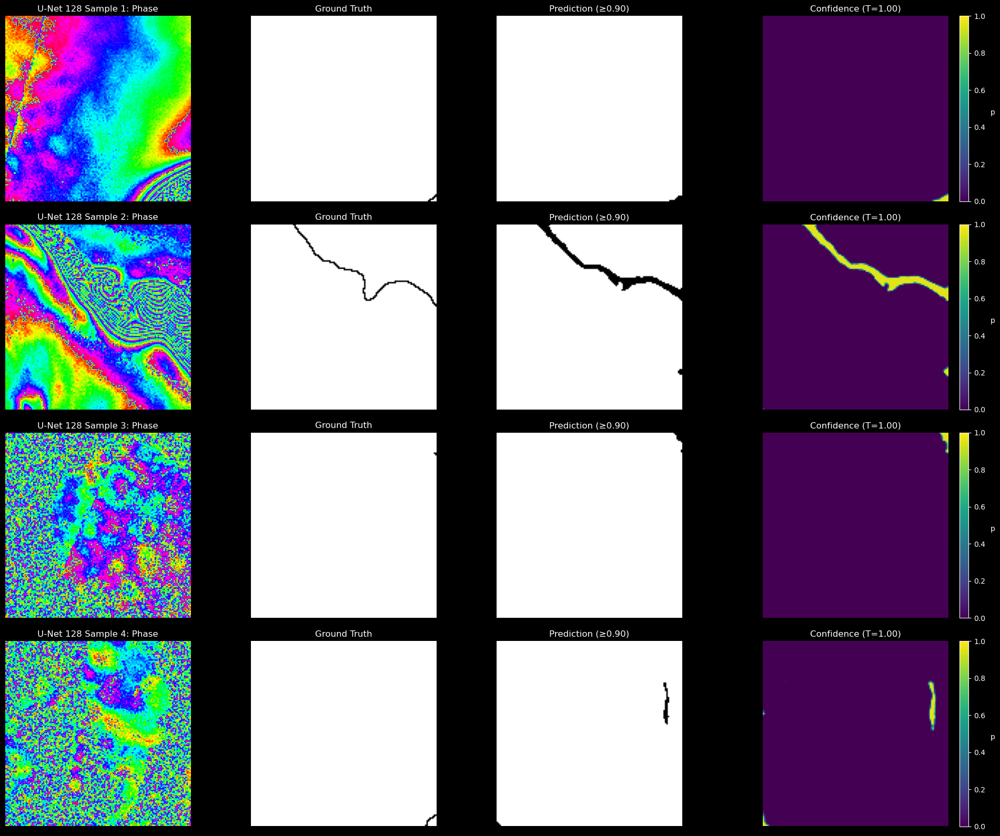


Visualizing U-Net 256 | threshold=0.850 | T=1.0


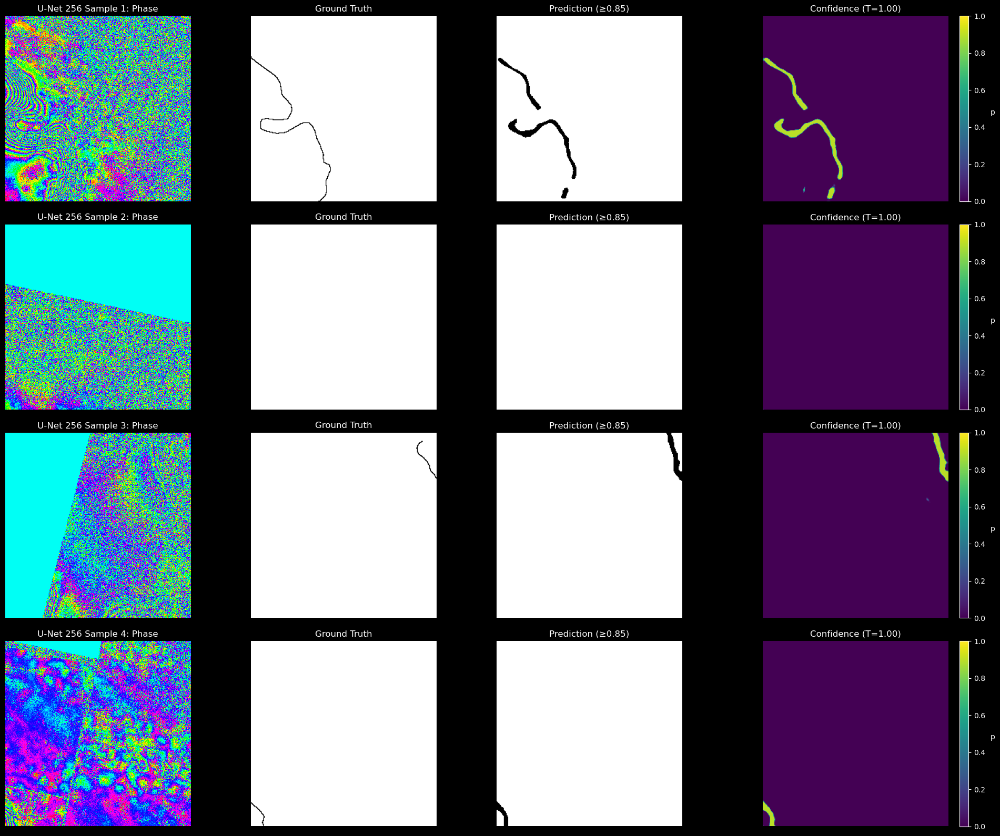


Visualizing AttU 128 | threshold=0.900 | T=1.0


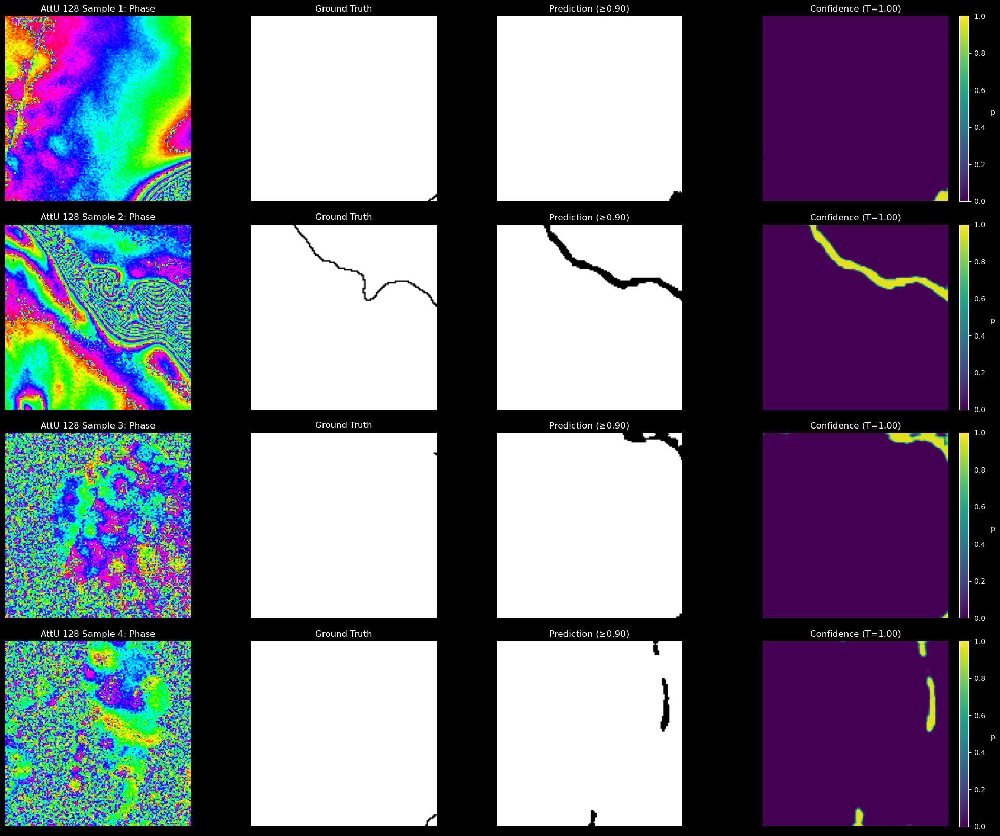


Visualizing AttU 256 | threshold=0.850 | T=1.0


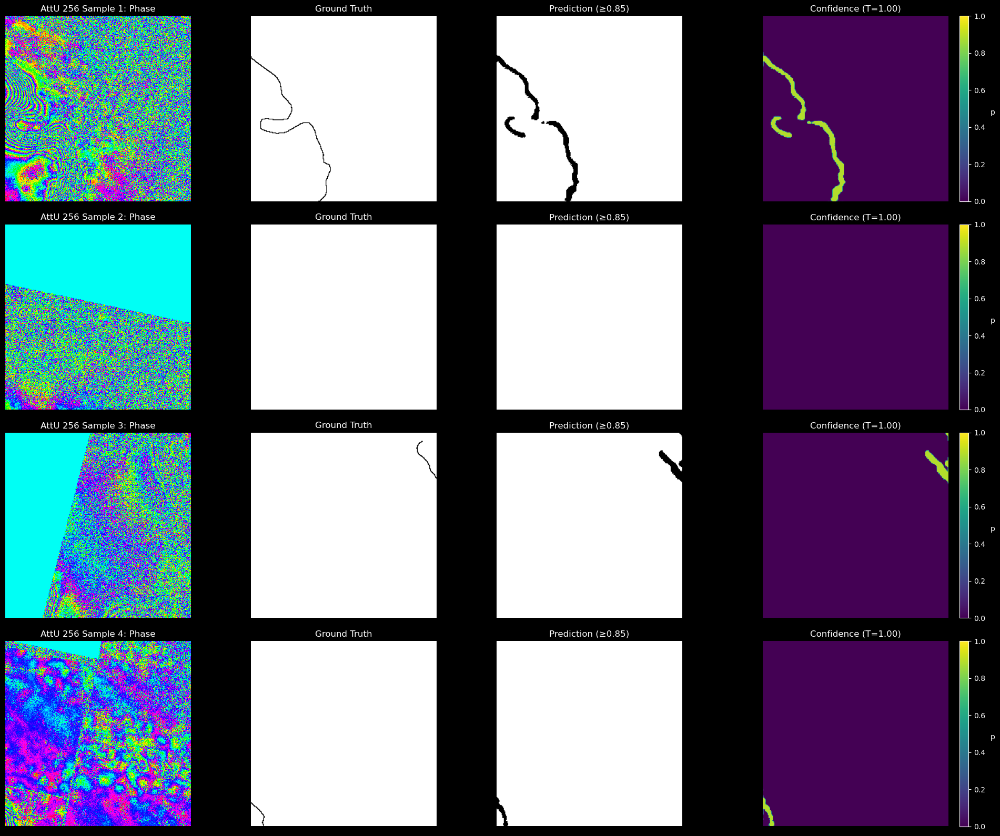


Visualizing UNet++ 128 | threshold=0.900 | T=1.0


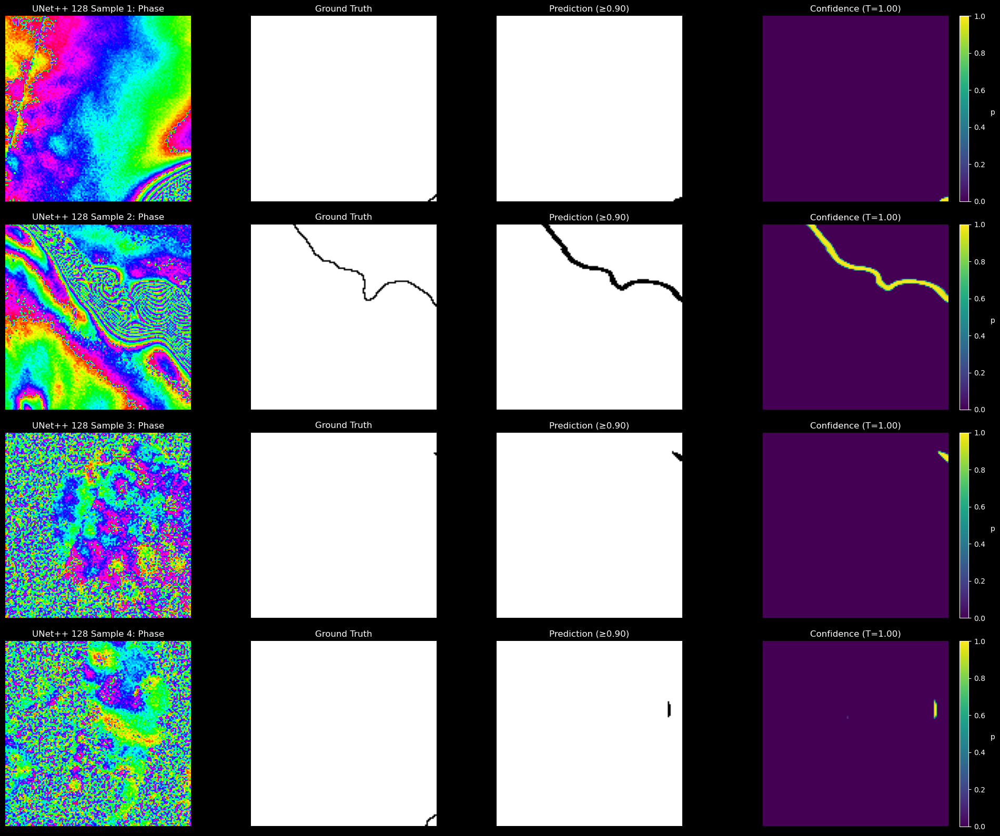


Visualizing UNet++ 256 | threshold=0.900 | T=1.0


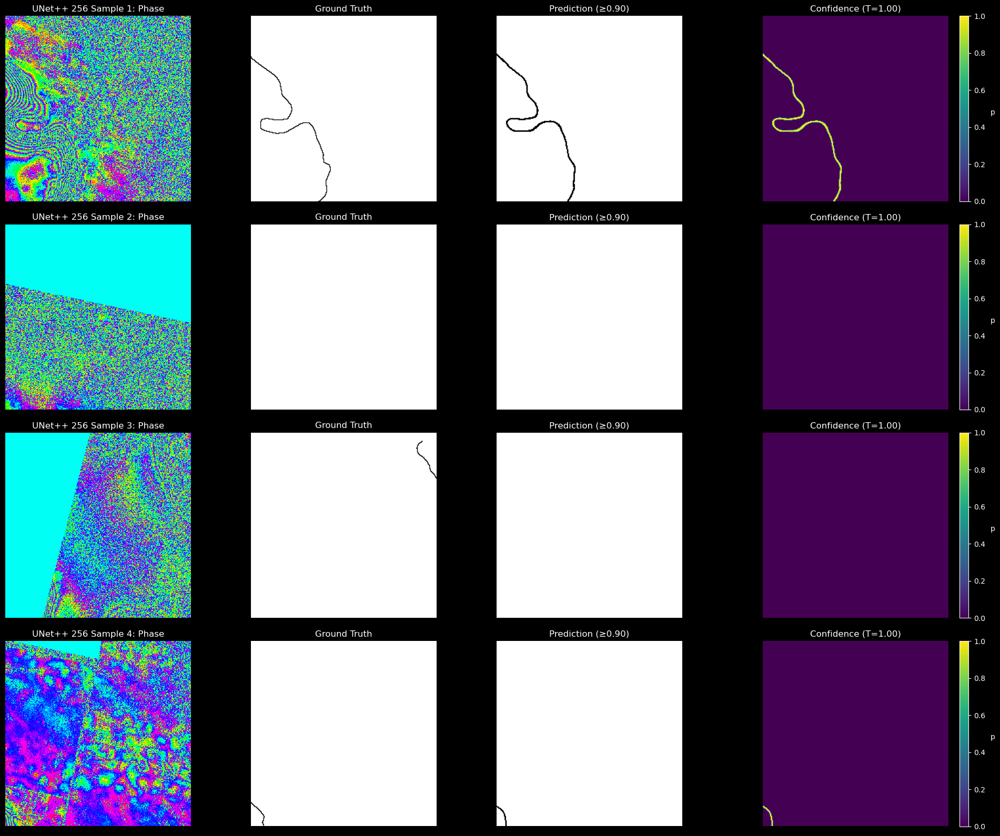

In [26]:
def select_fixed_batch(loader, seed=123, n_samples=4):
    g = torch.Generator().manual_seed(seed)
    batch, labels = next(iter(loader))
    # se batch è più grande di n_samples, scegliamo indici fissi con il seed
    if batch.size(0) > n_samples:
        idx = torch.randperm(batch.size(0), generator=g)[:n_samples]
        batch = batch[idx]
        labels = labels[idx]
    return batch, labels

@torch.no_grad()
def visualize_random_samples(model, loader, device, threshold=0.5, T=1.0, n_samples=4, title_prefix=""):

    batch_all, labels_all = select_fixed_batch(loader, seed=123, n_samples=n_samples)
    batch = batch_all.to(device)
    labels = labels_all.to(device)
    n_samples = batch.size(0)

    logits = model(batch)
    logits_main = get_main_logit(logits)
    probs_raw = torch.sigmoid(logits_main)
    probs_vis = torch.sigmoid(logits_main / T)
    bin_preds = (probs_raw >= threshold).float()

    # CPU per plot
    batch     = batch.cpu()
    labels    = labels.cpu()
    probs_vis = probs_vis.cpu()
    bin_preds = bin_preds.cpu()

    fig, axes = plt.subplots(n_samples, 4, figsize=(20, 4 * n_samples))
    if n_samples == 1:
        axes = np.expand_dims(axes, axis=0)

    for i in range(n_samples):
        axes[i, 0].imshow(batch[i, 0].numpy(), cmap='hsv', vmin=-1, vmax=1)
        axes[i, 0].set_title(f"{title_prefix} Sample {i+1}: Phase")
        axes[i, 0].axis('off')

        axes[i, 1].imshow(labels[i, 0].numpy(), cmap='binary', vmin=0, vmax=1)
        axes[i, 1].set_title("Ground Truth")
        axes[i, 1].axis('off')

        axes[i, 2].imshow(bin_preds[i, 0].numpy(), cmap='binary', vmin=0, vmax=1)
        axes[i, 2].set_title(f"Prediction (≥{threshold:.2f})")
        axes[i, 2].axis('off')

        im = axes[i, 3].imshow(probs_vis[i, 0].numpy(), cmap='viridis', vmin=0, vmax=1)
        axes[i, 3].set_title(f"Confidence (T={T:.2f})")
        axes[i, 3].axis('off')
        cbar = plt.colorbar(im, ax=axes[i, 3], fraction=0.046, pad=0.04)
        cbar.set_label('p', rotation=0, labelpad=10)

    plt.tight_layout()
    plt.savefig(f"checkpoints/random_samples{title_prefix}.png")
    plt.show()

with open("checkpoints/best_thresholds.json", "r") as f:
    best_thresholds = json.load(f)

T_vis = 1.0

to_show = [
    ("U-Net 128", "checkpoints/best_unet_128.pth", model_u_128, test_loader128, best_thresholds.get("unet_128", 0.5)),
    ("U-Net 256", "checkpoints/best_unet_256.pth", model_u_256, test_loader256, best_thresholds.get("unet_256", 0.5)),
    ("AttU 128",  "checkpoints/best_attunet_128.pth", model_att_128, test_loader128, best_thresholds.get("attunet_128", 0.5)),
    ("AttU 256",  "checkpoints/best_attunet_256.pth", model_att_256, test_loader256, best_thresholds.get("attunet_256", 0.5)),
    ("UNet++ 128", "checkpoints/best_unetpp_128.pth", model_unetpp_128, test_loader128, best_thresholds.get("unetpp_128", 0.5)),
    ("UNet++ 256", "checkpoints/best_unetpp_256.pth", model_unetpp_256, test_loader256, best_thresholds.get("unetpp_256", 0.5)),
]

for title, path, model, loader, thr in to_show:
    model.load_state_dict(torch.load(path, map_location=device))
    model.eval()
    print(f"\nVisualizing {title} | threshold={thr:.3f} | T={T_vis}")
    visualize_random_samples(model, loader, device, threshold=thr, T=T_vis, n_samples=4, title_prefix=title)

,model,dice,precision,recall,bfscore,iou_tol2,hd95,threshold
0,unetpp_256,0.368780,0.433441,0.468923,0.648486,0.567575,26.383697,0.90
1,unetpp_128,0.288194,0.317673,0.452998,0.577703,0.515327,22.367313,0.90
2,unet_256,0.193275,0.201949,0.440901,0.388136,0.330323,58.249595,0.85
3,unet_128,0.188726,0.173672,0.458331,0.400405,0.348838,41.368515,0.90
4,attunet_128,0.168433,0.131983,0.509647,0.370901,0.337522,37.530789,0.90
5,attunet_256,0.167298,0.168835,0.480914,0.331527,0.301045,55.409125,0.85


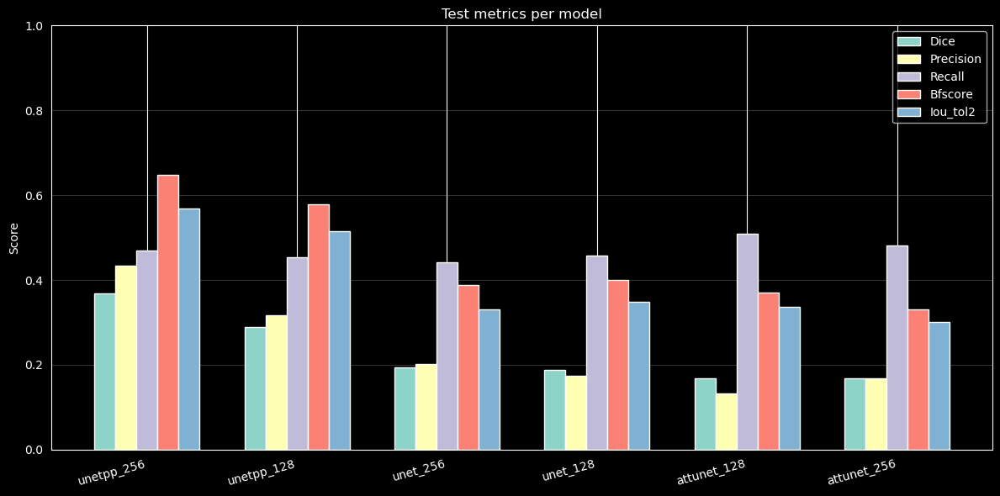

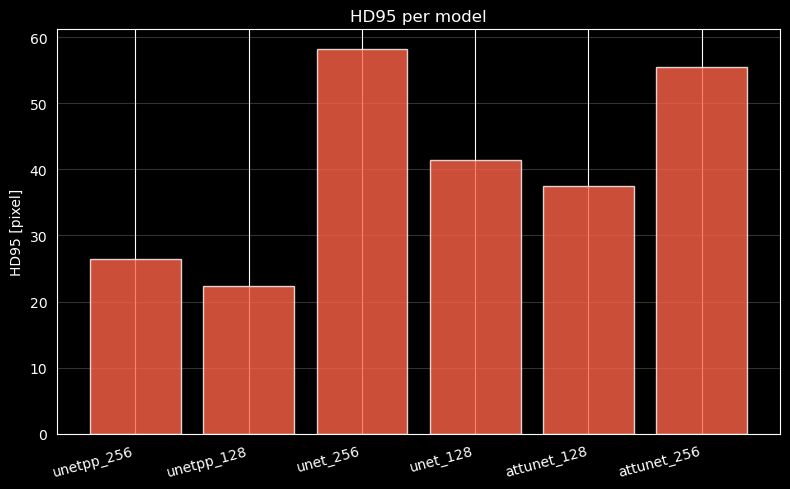

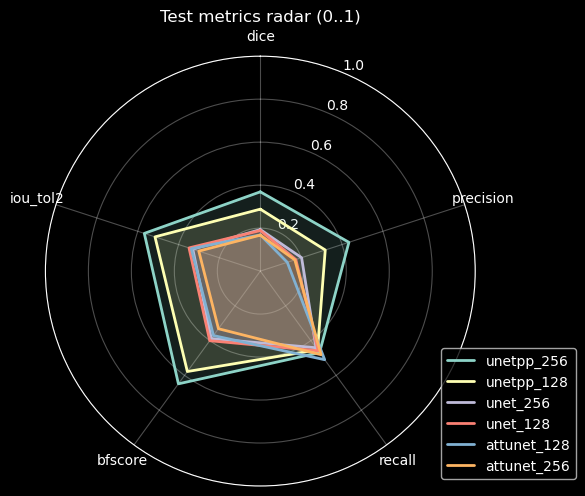

Salvati: checkpoints/test_metrics_barplot.png, checkpoints/hd95_barplot.png, checkpoints/test_metrics_radar.png, checkpoints/test_results_table.csv


In [23]:
with open("checkpoints/test_results.json","r") as f:
    results = json.load(f)

rows = []
for name, vals in results.items():
    rows.append({
        "model": name,
        "dice": vals["dice"],
        "precision": vals["precision"],
        "recall": vals["recall"],
        "bfscore": vals["bfscore"],
        "iou_tol2": vals["iou_tol2"],
        "hd95": vals["hd95"],
        "threshold": vals.get("threshold", 0.5)
    })
df = pd.DataFrame(rows)
df = df.sort_values(by="dice", ascending=False).reset_index(drop=True)
display(df)

df.to_csv("checkpoints/test_results_table.csv", index=False)

# Plot 1: Barre per le metriche principali (escludo hd95 perché ha scala diversa)
metrics_bar = ["dice", "precision", "recall", "bfscore", "iou_tol2"]
x = np.arange(len(df))
width = 0.14

plt.figure(figsize=(12, 6))
for i, m in enumerate(metrics_bar):
    plt.bar(x + (i - (len(metrics_bar)-1)/2) * width, df[m], width, label=m.capitalize())
plt.xticks(x, df["model"], rotation=15, ha="right")
plt.ylim(0, 1.0)
plt.ylabel("Score")
plt.title("Test metrics per model")
plt.legend()
plt.grid(axis="y", alpha=0.2)
plt.tight_layout()
plt.savefig("checkpoints/test_metrics_barplot.png", dpi=200)
plt.show()

# Plot 2: HD95 (più basso è meglio)
plt.figure(figsize=(8, 5))
plt.bar(df["model"], df["hd95"], color="tomato", alpha=0.8)
plt.xticks(rotation=15, ha="right")
plt.ylabel("HD95 [pixel]")
plt.title("HD95 per model")
plt.grid(axis="y", alpha=0.2)
plt.tight_layout()
plt.savefig("checkpoints/hd95_barplot.png", dpi=200)
plt.show()

print("Salvati: checkpoints/test_metrics_barplot.png, checkpoints/hd95_barplot.png, checkpoints/test_results_table.csv")

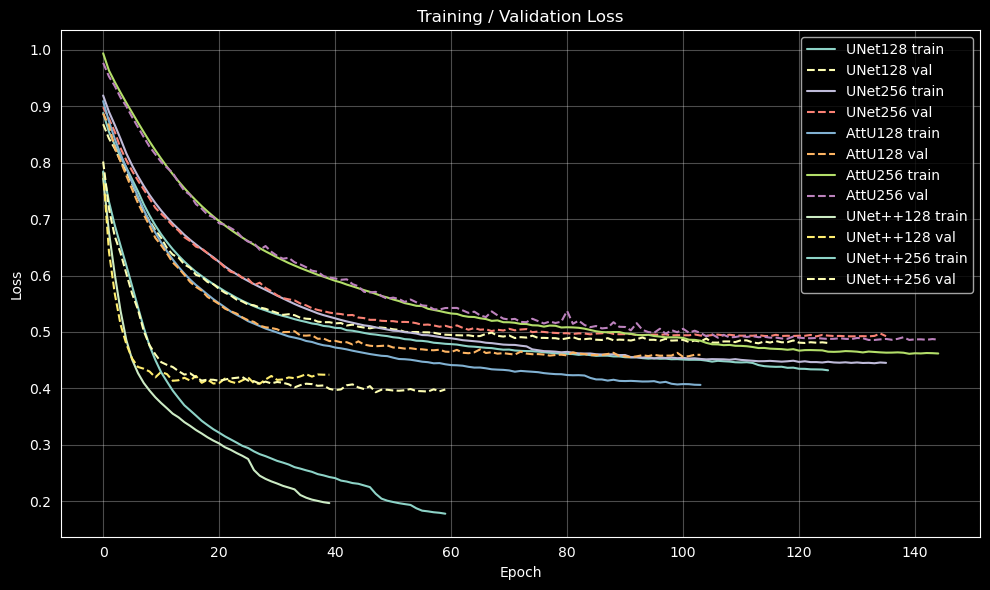

Saved: checkpoints/loss_curves.png


In [27]:
def plot_loss_curves(histories, labels, out_path="checkpoints/loss_curves.png"):
    plt.figure(figsize=(10,6))
    for hist, lab in zip(histories, labels):
        plt.plot(hist["train_loss"], label=f"{lab} train")
        plt.plot(hist["val_loss"],   label=f"{lab} val", linestyle="--")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Training / Validation Loss")
    plt.grid(alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.savefig(out_path, dpi=200)
    plt.show()
    print(f"Saved: {out_path}")

plot_loss_curves(
    histories=[hist_u_128, hist_u_256, hist_att_128, hist_att_256, hist_unetpp_128, hist_unetpp_256],
    labels=["UNet128","UNet256","AttU128","AttU256","UNet++128","UNet++256"],
    out_path="checkpoints/loss_curves.png"
)

Saved: checkpoints/unetpp256_sample_fringe.tif  (layers: phase, GT, pred_bin)


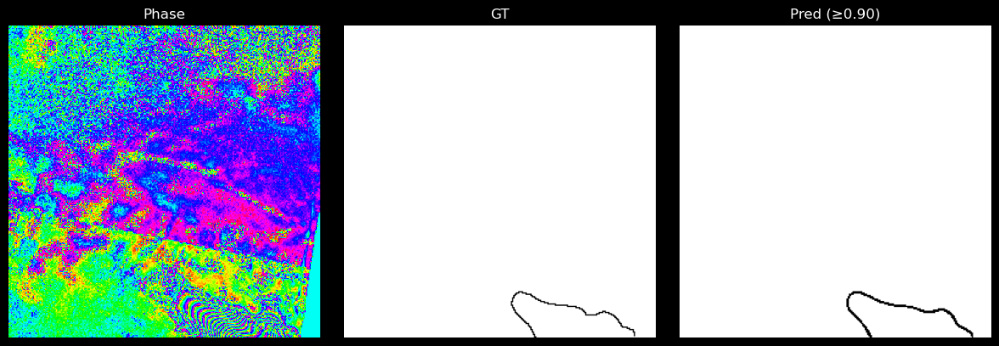

In [121]:
@torch.no_grad()
def save_and_show_unetpp_sample(model, loader, device, threshold, out_path="checkpoints/unetpp_sample.tif", seed=123):
    model.eval()
    batch, labels = select_fixed_batch(loader, seed=seed, n_samples=1)  # 1 sola immagine coerente
    x = batch.to(device)
    y = labels.to(device)
    logits = model(x)
    logits_main = get_main_logit(logits)
    probs = torch.sigmoid(logits_main)
    pred_bin = (probs >= threshold).float()

    # estrai la prima (unica) immagine
    phase = batch[0, 0].cpu().numpy()
    gt    = labels[0, 0].cpu().numpy()
    pred  = pred_bin[0, 0].cpu().numpy()

    # salva TIFF a 3 layer
    tiff.imwrite(
        out_path,
        np.stack([phase, gt, pred]).astype(np.float32),
        photometric='minisblack'
    )
    print(f"Saved: {out_path}  (layers: phase, GT, pred_bin)")

    # mostra per valutare rapidamente se è un “optimal case”
    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
    axs[0].imshow(phase, cmap='hsv', vmin=-1, vmax=1); axs[0].set_title("Phase"); axs[0].axis('off')
    axs[1].imshow(gt, cmap='binary', vmin=0, vmax=1); axs[1].set_title("GT"); axs[1].axis('off')
    axs[2].imshow(pred, cmap='binary', vmin=0, vmax=1); axs[2].set_title(f"Pred (≥{threshold:.2f})"); axs[2].axis('off')
    plt.tight_layout()
    plt.show()

model_unetpp_256.load_state_dict(torch.load("checkpoints/best_unetpp_256.pth", map_location=device))
save_and_show_unetpp_sample(
    model_unetpp_256,
    test_loader256,
    device,
    threshold=best_thresholds.get("unetpp_256", 0.5),
    out_path="checkpoints/unetpp256_sample_fringe.tif",
    seed=1749
)

In [35]:
import datetime
from pathlib import Path

@torch.no_grad()
def compare_models_128(
    best_thr_path="checkpoints/best_thresholds.json",
    out_dir="checkpoints",
    use_timestamp=True,
    seed=None  # es. 123 per scelta ripetibile; None per random a ogni run
):
    rng = random.Random(seed)

    with open(best_thr_path, "r") as f:
        best_thresholds = json.load(f)

    cfgs_128 = [
        ("U-Net 128",  U_net(out_ch=1, in_ch=2),          "checkpoints/best_unet_128.pth",    best_thresholds.get("unet_128", 0.5)),
        ("AttU 128",   Attention_U_net(out_ch=1, in_ch=2),"checkpoints/best_attunet_128.pth", best_thresholds.get("attunet_128", 0.5)),
        ("UNet++ 128", UNetPP(out_ch=1, in_ch=2, base_ch=32, deep_supervision=True), "checkpoints/best_unetpp_128.pth", best_thresholds.get("unetpp_128", 0.5)),
    ]

    ds = test_loader128.dataset
    ridx = rng.randrange(len(ds))
    x, y = ds[ridx]
    x = x.unsqueeze(0).to(device)
    y = y.unsqueeze(0).to(device)

    rows = []
    for name, model, ckpt, thr in cfgs_128:
        model.load_state_dict(torch.load(ckpt, map_location=device))
        model.to(device).eval()
        logits = model(x)
        logits_main = get_main_logit(logits)
        probs = torch.sigmoid(logits_main)
        pred = (probs >= thr).float()

        rows.append((
            name,
            x[0, 0].cpu().numpy(),
            y[0, 0].cpu().numpy(),
            pred[0, 0].cpu().numpy(),
            probs[0, 0].cpu().numpy(),
            thr
        ))

    n = len(rows)
    fig, axes = plt.subplots(n, 4, figsize=(16, 3.6 * n))
    if n == 1:
        axes = np.expand_dims(axes, 0)

    for i, (name, phase, gt, pb, conf, thr) in enumerate(rows):
        axes[i, 0].imshow(phase, cmap="hsv", vmin=-1, vmax=1); axes[i, 0].set_title(f"{name} — Phase"); axes[i, 0].axis("off")
        axes[i, 1].imshow(gt,   cmap="binary", vmin=0, vmax=1); axes[i, 1].set_title("Ground Truth"); axes[i, 1].axis("off")
        axes[i, 2].imshow(pb,   cmap="binary", vmin=0, vmax=1); axes[i, 2].set_title(f"Prediction (≥{thr:.2f})"); axes[i, 2].axis("off")
        im = axes[i, 3].imshow(conf, cmap="viridis", vmin=0, vmax=1); axes[i, 3].set_title("Confidence"); axes[i, 3].axis("off")
        plt.colorbar(im, ax=axes[i, 3], fraction=0.046, pad=0.04)

    plt.tight_layout()
    Path(out_dir).mkdir(parents=True, exist_ok=True)
    ts = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
    fname = f"compare_128_models_{ts}.png" if use_timestamp else "compare_128_models.png"
    out_path = Path(out_dir) / fname
    plt.savefig(out_path, dpi=200)
    plt.show()
    print(f"[128] Saved: {out_path} | sample idx in test subset: {ridx}")


@torch.no_grad()
def compare_models_256(
    best_thr_path="checkpoints/best_thresholds.json",
    out_dir="checkpoints",
    use_timestamp=True,
    seed=None  # es. 123 per scelta ripetibile; None per random a ogni run
):
    rng = random.Random(seed)

    with open(best_thr_path, "r") as f:
        best_thresholds = json.load(f)

    cfgs_256 = [
        ("U-Net 256",  U_net(out_ch=1, in_ch=2),          "checkpoints/best_unet_256.pth",    best_thresholds.get("unet_256", 0.5)),
        ("AttU 256",   Attention_U_net(out_ch=1, in_ch=2),"checkpoints/best_attunet_256.pth", best_thresholds.get("attunet_256", 0.5)),
        ("UNet++ 256", UNetPP(out_ch=1, in_ch=2, base_ch=32, deep_supervision=True), "checkpoints/best_unetpp_256.pth", best_thresholds.get("unetpp_256", 0.5)),
    ]

    ds = test_loader256.dataset
    ridx = rng.randrange(len(ds))
    x, y = ds[ridx]
    x = x.unsqueeze(0).to(device)
    y = y.unsqueeze(0).to(device)

    rows = []
    for name, model, ckpt, thr in cfgs_256:
        model.load_state_dict(torch.load(ckpt, map_location=device))
        model.to(device).eval()
        logits = model(x)
        logits_main = get_main_logit(logits)
        probs = torch.sigmoid(logits_main)
        pred = (probs >= thr).float()

        rows.append((
            name,
            x[0, 0].cpu().numpy(),
            y[0, 0].cpu().numpy(),
            pred[0, 0].cpu().numpy(),
            probs[0, 0].cpu().numpy(),
            thr
        ))

    n = len(rows)
    fig, axes = plt.subplots(n, 4, figsize=(16, 3.6 * n))
    if n == 1:
        axes = np.expand_dims(axes, 0)

    for i, (name, phase, gt, pb, conf, thr) in enumerate(rows):
        axes[i, 0].imshow(phase, cmap="hsv", vmin=-1, vmax=1); axes[i, 0].set_title(f"{name} — Phase"); axes[i, 0].axis("off")
        axes[i, 1].imshow(gt,   cmap="binary", vmin=0, vmax=1); axes[i, 1].set_title("Ground Truth"); axes[i, 1].axis("off")
        axes[i, 2].imshow(pb,   cmap="binary", vmin=0, vmax=1); axes[i, 2].set_title(f"Prediction (≥{thr:.2f})"); axes[i, 2].axis("off")
        im = axes[i, 3].imshow(conf, cmap="viridis", vmin=0, vmax=1); axes[i, 3].set_title("Confidence"); axes[i, 3].axis("off")
        plt.colorbar(im, ax=axes[i, 3], fraction=0.046, pad=0.04)

    plt.tight_layout()
    Path(out_dir).mkdir(parents=True, exist_ok=True)
    ts = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
    fname = f"compare_256_models_{ts}.png" if use_timestamp else "compare_256_models.png"
    out_path = Path(out_dir) / fname
    plt.savefig(out_path, dpi=200)
    plt.show()
    print(f"[256] Saved: {out_path} | sample idx in test subset: {ridx}")

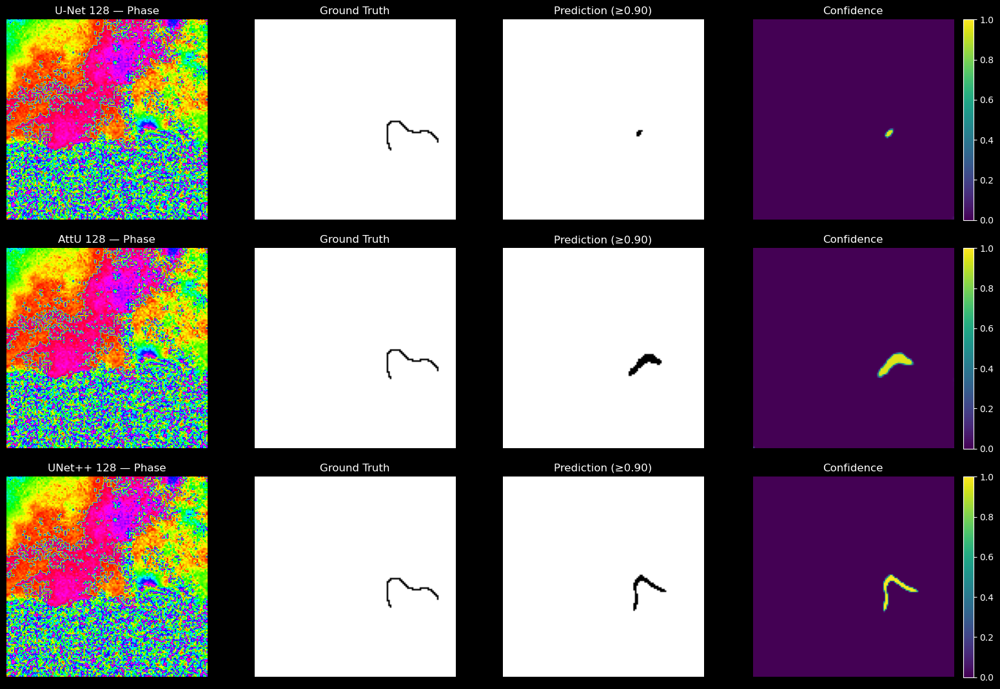

[128] Saved: checkpoints/compare_128_models_20260120_151238.png | sample idx in test subset: 2616


In [47]:
compare_models_128(seed=3000)

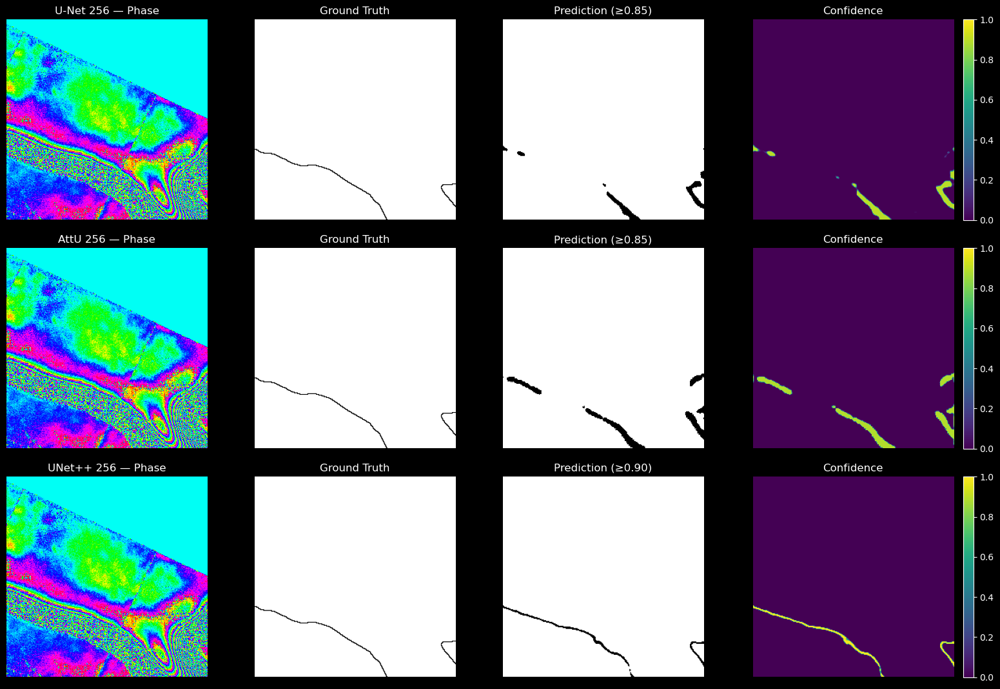

[256] Saved: checkpoints/compare_256_models_20260120_151358.png | sample idx in test subset: 1304


In [52]:
compare_models_256(seed=804785)